In [1]:
#!"./setup-EForecast.sh"

In [1]:
#!export PYTHONPATH='/Users/markusdollmann/desktop/ElectricityForecast/1_modules/'
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.ensemble import RandomForestRegressor

In [2]:
df_weather = pd.read_csv('2_raw_data/Table-2.csv',
infer_datetime_format=True,
index_col=0,
parse_dates=True,
dayfirst=True)

In [3]:
df_electricity = pd.read_csv('2_raw_data/Table-3.csv',
infer_datetime_format=True,
index_col=0,
parse_dates=True,
dayfirst=True)

In [10]:
%reload_ext autoreload
%autoreload 2
from doodahs import doodahs

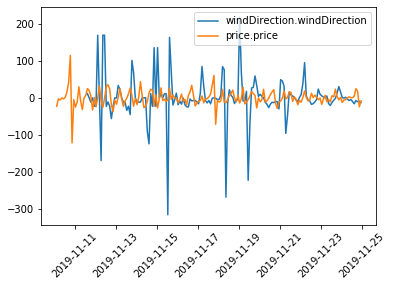

In [14]:
doodahs.plot_two_vars(df_weather, 3,
              df_electricity, 0,onediff=True,twodiff=True)

In [36]:
df.Interval

0      26/10/2019 01:00 PM
1      26/10/2019 03:00 PM
2      26/10/2019 05:00 PM
3      26/10/2019 07:00 PM
4      26/10/2019 09:00 PM
              ...         
440    02/12/2019 05:00 AM
441    02/12/2019 07:00 AM
442    02/12/2019 09:00 AM
443    02/12/2019 11:00 AM
444    02/12/2019 01:00 PM
Name: Interval, Length: 445, dtype: object

In [15]:
df_weather['temperature.temperature'].name

'temperature.temperature'

In [122]:
# corr_df = pd.DataFrame()
# corr_df['price'] = df_electricity.iloc[:,0]
# corr_df['d_price'] = df_electricity.iloc[:,0].diff()
# corr_df['generated'] = df_electricity.iloc[:,1]
# corr_df['d_generated'] = df_electricity.iloc[:,1].diff()

# corr_df['temperature'] = df_weather.iloc[:,0]
corr_df['dd_temperature'] = df_weather.iloc[:,0].diff(2)
# corr_df['rain_prob'] = df_weather.iloc[:,1]
corr_df['dd_rain_prob'] = df_weather.iloc[:,1].diff(2)
# corr_df['wind_speed'] = df_weather.iloc[:,2]
corr_df['dd_wind_speed'] = df_weather.iloc[:,2].diff(2)
# corr_df['wind_direction'] = df_weather.iloc[:,3]
corr_df['dd_wind_direction'] = df_weather.iloc[:,3].diff(2)
# corr_df['cloud_cover'] = df_weather.iloc[:,4]
corr_df['dd_cloud_cover'] = df_weather.iloc[:,4].diff(2)
# corr_df['pressure'] = df_weather.iloc[:,5]
corr_df['dd_pressure'] = df_weather.iloc[:,5].diff(2)
corr_df.head()

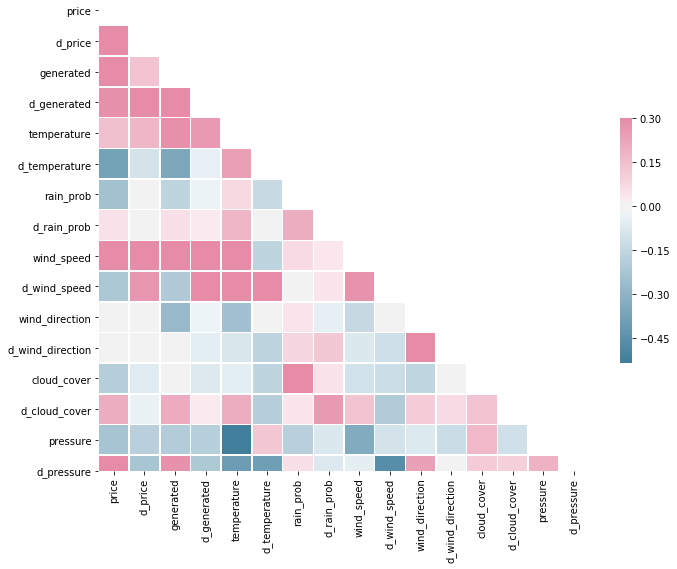

In [123]:
corr = corr_df.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 0, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [124]:
corr.price.sort_values(ascending=False)

price               1.000000
generated           0.350503
d_price             0.344840
d_pressure          0.338431
wind_speed          0.336085
d_generated         0.285596
d_cloud_cover       0.201910
temperature         0.147448
d_rain_prob         0.051128
d_wind_direction    0.003757
wind_direction      0.003189
cloud_cover        -0.191113
d_wind_speed       -0.215593
pressure           -0.232471
rain_prob          -0.239410
d_temperature      -0.376308
Name: price, dtype: float64

/Users/markusdollmann/anaconda3/envs/EFORECAST/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/markusdollmann/anaconda3/envs/EFORECAST/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


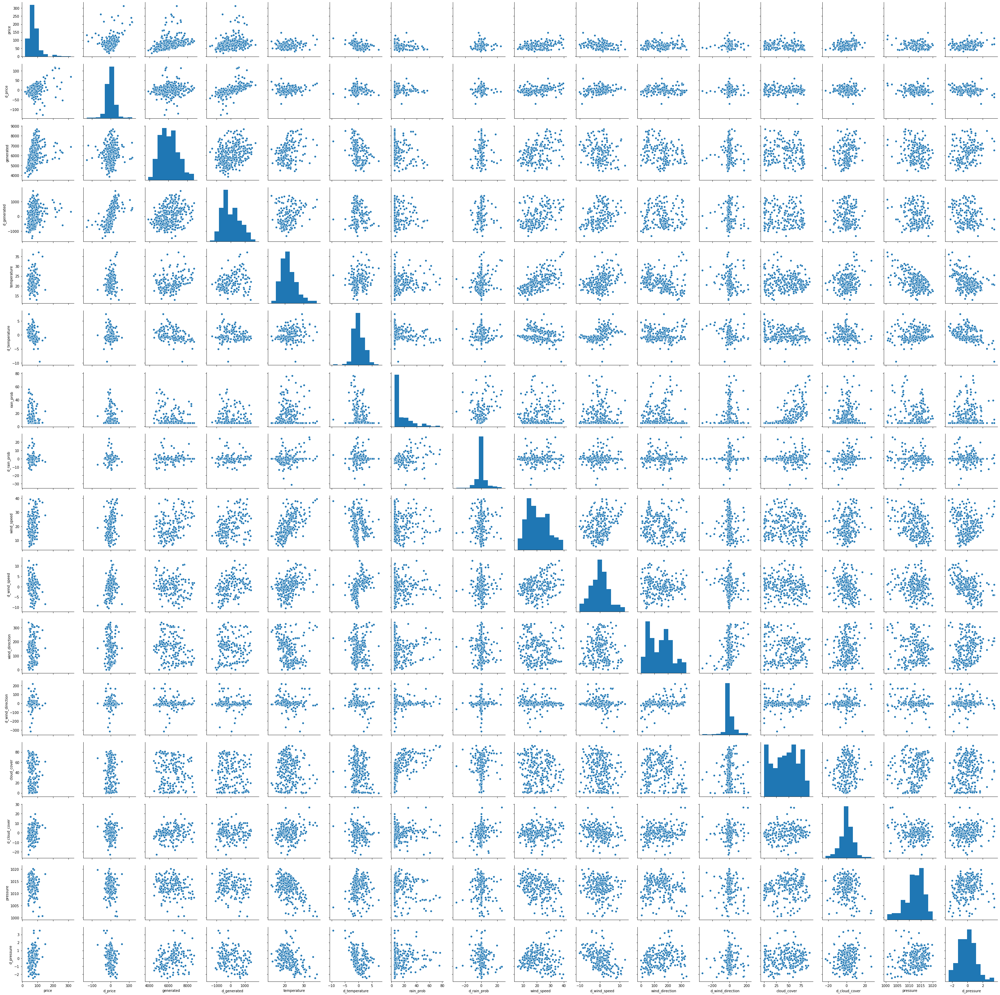

In [125]:
sns.pairplot(corr_df)

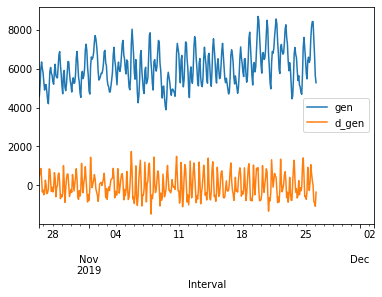

In [238]:
corr_df.generated.plot(label='gen')
corr_df.d_generated.plot(label='d_gen')
plt.legend(loc='best')

In [154]:
corr_df.replace([np.inf, -np.inf], np.nan, inplace=True)
temp_df = corr_df.dropna(how='any', axis=0)
temp_df.reset_index()

,Interval,price,d_price,generated,d_generated,temperature,d_temperature,rain_prob,d_rain_prob,wind_speed,d_wind_speed,wind_direction,d_wind_direction,cloud_cover,d_cloud_cover,pressure,d_pressure
0,2019-11-11 15:00:00,73.902058,25.125357,6494.522996,1067.599541,25.500000,-0.500000,5.000000,0.000000,32.500000,6.500000,56.500000,11.500000,16.500000,-15.000000,1011.700000,-1.750000
1,2019-11-11 17:00:00,93.971053,20.068995,7366.731393,872.208396,24.000000,-1.500000,5.000000,0.000000,36.000000,3.500000,56.500000,0.000000,22.000000,5.500000,1011.200000,-0.500000
2,2019-11-11 19:00:00,99.080228,5.109175,7331.117571,-35.613821,21.500000,-2.500000,5.000000,0.000000,31.500000,-4.500000,45.000000,-11.500000,12.500000,-9.500000,1011.750000,0.550000
3,2019-11-11 21:00:00,66.364615,-32.715613,6477.196846,-853.920725,20.500000,-1.000000,5.000000,0.000000,24.000000,-7.500000,45.000000,0.000000,8.500000,-4.000000,1012.150000,0.400000
4,2019-11-11 23:00:00,67.524743,1.160128,5991.608000,-485.588846,19.500000,-1.000000,5.000000,0.000000,17.000000,-7.000000,23.000000,-22.000000,14.500000,6.000000,1011.950000,-0.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,2019-11-25 19:00:00,92.356948,-3.926505,8416.223500,3.602500,24.250000,-1.504717,30.730769,-3.306967,26.269231,-3.447750,36.134615,-12.355951,63.019231,-6.226052,1008.250000,0.483962
171,2019-11-25 21:00:00,63.504362,-28.852585,7596.334000,-819.889500,23.673077,-0.576923,22.961538,-7.769231,19.519231,-6.750000,24.192308,-11.942308,58.384615,-4.634615,1008.611538,0.361538
172,2019-11-25 23:00:00,48.979995,-14.524367,6688.257250,-908.076750,22.686275,-0.986802,13.333333,-9.628205,16.313725,-3.205505,16.235294,-7.957014,40.254902,-18.129713,1008.066667,-0.544872
173,2019-11-26 01:00:00,41.075000,-7.904995,5618.558000,-1069.699250,21.860000,-0.826275,8.280000,-5.053333,15.700000,-0.613725,16.420000,0.184706,25.700000,-14.554902,1006.854000,-1.212667


In [207]:
pear = pd.DataFrame()
pear['testfeature'] = temp_df.temperature * temp_df.rain_prob * temp_df.wind_speed * temp_df.wind_direction

In [229]:
test = pd.concat([temp_df.iloc[:,1:16],pear.testfeature],axis=1)
test.shape
#test.head()


(175, 16)

In [235]:
RFR = RandomForestRegressor(n_estimators=1000, random_state=42)
#RFR.fit(test, temp_df.iloc[:,0])# 
RFR.fit(temp_df.iloc[:,1:16],temp_df.iloc[:,0])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=1000,
                      n_jobs=None, oob_score=False, random_state=42, verbose=0,
                      warm_start=False)

In [236]:
RFR.feature_importances_

array([0.1275556 , 0.53829759, 0.01594879, 0.02628028, 0.04340197,
       0.0239567 , 0.02253789, 0.03686261, 0.01521041, 0.03173221,
       0.01741385, 0.02418735, 0.01820374, 0.03611668, 0.02229432])

In [237]:
apple = pd.DataFrame()
apple['feature'] = [*temp_df.iloc[:,1:16].columns]#,'testfeature']
apple['importance'] = [*RFR.feature_importances_]
apple.sort_values(by=['importance'], ascending=False)

,feature,importance
1,generated,0.538298
0,d_price,0.127556
4,d_temperature,0.043402
7,wind_speed,0.036863
13,pressure,0.036117
9,wind_direction,0.031732
3,temperature,0.026280
11,cloud_cover,0.024187
5,rain_prob,0.023957
6,d_rain_prob,0.022538


In [31]:
newframe = doodahs.create_diffs(df_weather,np.arange(0,7,1))

In [35]:
newframe.tail(20)

,temperature.temperature,rainProb.rainProb,windSpeed.windSpeed,windDirection.windDirection,cloudCover.cloudCover,pressure.pressure,d_temperature.temperature,d_rainProb.rainProb,d_windSpeed.windSpeed,d_windDirection.windDirection,d_cloudCover.cloudCover,d_pressure.pressure,d_d_temperature.temperature
Interval,,,,,,,,,,,,,
2019-11-30 23:00:00,22.125,70.125,16.250,219.750000,92.625000,1009.137500,-1.732143,-6.517857,-1.964286,78.035714,0.482143,0.723214,0.196429
2019-12-01 01:00:00,20.750,75.500,17.125,216.750000,90.000000,1008.250000,-1.375000,5.375000,0.875000,-3.000000,-2.625000,-0.887500,0.357143
2019-12-01 03:00:00,19.375,51.875,15.750,219.500000,85.125000,1007.362500,-1.375000,-23.625000,-1.375000,2.750000,-4.875000,-0.887500,0.000000
2019-12-01 05:00:00,18.125,60.875,15.625,216.750000,64.125000,1007.112500,-1.250000,9.000000,-0.125000,-2.750000,-21.000000,-0.250000,0.125000
2019-12-01 07:00:00,19.500,48.375,18.625,228.125000,59.375000,1007.500000,1.375000,-12.500000,3.000000,11.375000,-4.750000,0.387500,2.625000
2019-12-01 09:00:00,21.375,53.875,17.250,230.875000,61.625000,1007.437500,1.875000,5.500000,-1.375000,2.750000,2.250000,-0.062500,0.500000
2019-12-01 11:00:00,23.500,22.500,15.250,163.250000,52.500000,1006.275000,2.125000,-31.375000,-2.000000,-67.625000,-9.125000,-1.162500,0.250000
2019-12-01 13:00:00,25.000,17.750,23.750,11.500000,59.000000,1003.950000,1.500000,-4.750000,8.500000,-151.750000,6.500000,-2.325000,-0.625000
2019-12-01 15:00:00,25.500,15.500,26.000,90.250000,48.250000,1002.075000,0.500000,-2.250000,2.250000,78.750000,-10.750000,-1.875000,-1.000000


'd_temperature.temperature'

In [22]:
import sys
print(sys.path)

['/private/var/folders/5j/ddgcgwys5wl98b2v_9sdhw600000gn/T/91f09a1a-284c-42b6-b491-25fd75d67e1a', '/Users/markusdollmann/anaconda3/envs/EFORECAST/lib/python37.zip', '/Users/markusdollmann/anaconda3/envs/EFORECAST/lib/python3.7', '/Users/markusdollmann/anaconda3/envs/EFORECAST/lib/python3.7/lib-dynload', '', '/Users/markusdollmann/anaconda3/envs/EFORECAST/lib/python3.7/site-packages', '/Users/markusdollmann/Desktop/ElectricityForecast/1_modules', '/Users/markusdollmann/anaconda3/envs/EFORECAST/lib/python3.7/site-packages/IPython/extensions', '/Users/markusdollmann/.ipython']
